Nama :Yahya Handarestanto

Nim   : 21.11.4365

Kelas: 21.if08

import library

In [ ]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import KFold
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

## VISUALISASI DATA

In [ ]:
# Importing the dataset
dataset = pd.read_csv('/content/online_shoppers_intention.csv')
dataset.head(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


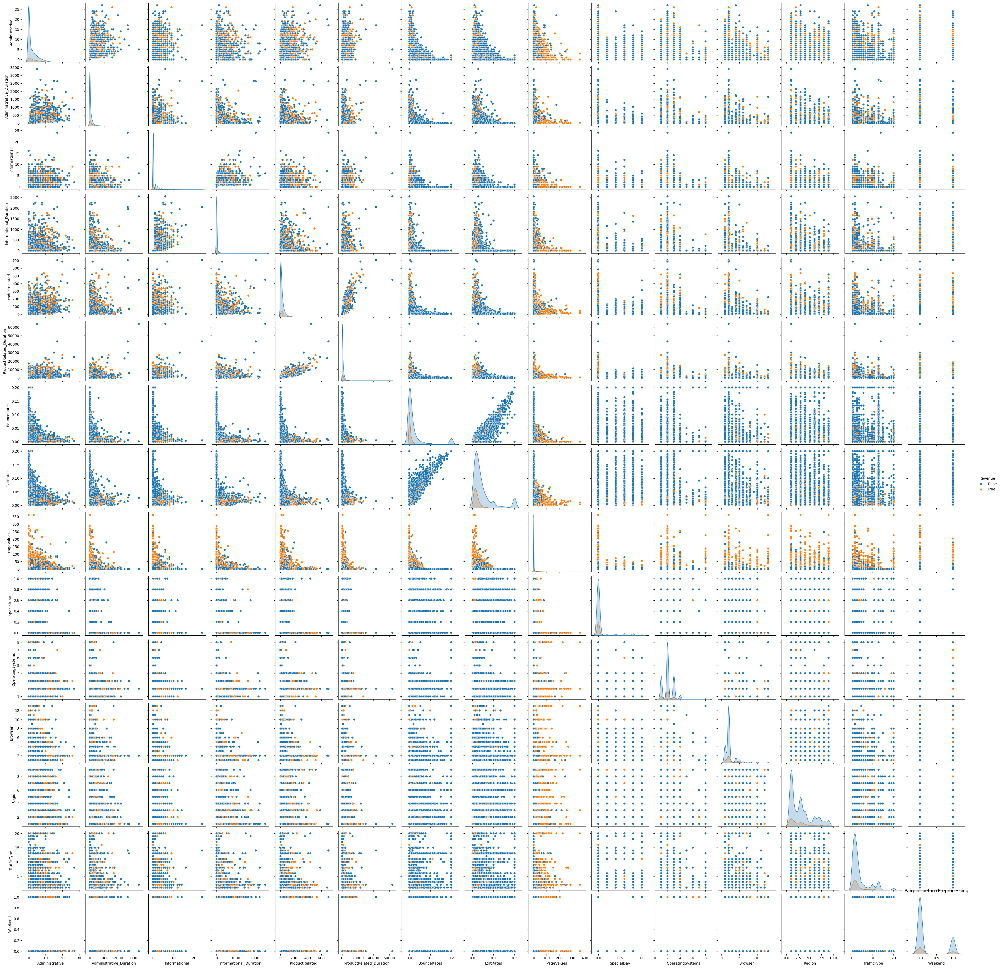

In [ ]:
# Visualizing the data before preprocessing
sns.pairplot(dataset, hue='Revenue')
plt.title('Pairplot before Preprocessing')
plt.show()

In [ ]:
# Display the dataset
print(dataset)

       Administrative  Administrative_Duration  Informational  \
0                   0                      0.0              0   
1                   0                      0.0              0   
2                   0                      0.0              0   
3                   0                      0.0              0   
4                   0                      0.0              0   
...               ...                      ...            ...   
12325               3                    145.0              0   
12326               0                      0.0              0   
12327               0                      0.0              0   
12328               4                     75.0              0   
12329               0                      0.0              0   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                         0.0               1                 0.000000   
1                         0.0               2                64.000000 

In [ ]:
# Data types
print(dataset.dtypes)

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                        int64
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                  int64
Weekend                      int64
Revenue                      int64
dtype: object


In [ ]:
# Statistical description
print(dataset.describe())

       Administrative  Administrative_Duration  Informational  \
count    12330.000000             12330.000000   12330.000000   
mean         2.315166                80.818611       0.503569   
std          3.321784               176.779107       1.270156   
min          0.000000                 0.000000       0.000000   
25%          0.000000                 0.000000       0.000000   
50%          1.000000                 7.500000       0.000000   
75%          4.000000                93.256250       0.000000   
max         27.000000              3398.750000      24.000000   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
count            12330.000000    12330.000000             12330.000000   
mean                34.472398       31.731468              1194.746220   
std                140.749294       44.475503              1913.669288   
min                  0.000000        0.000000                 0.000000   
25%                  0.000000        7.00000

In [ ]:
print("Informasi Variabel ")
# Detailed information about the DataFrame
dataset.info()

Informasi Variabel 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  int64  
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  Tr

## PRE-PROCESING DATA


prepocesing melipupi beberapa tahap:
*   pengecekan missing value atau nilai null
*   One-Hot encoding atau pelabelan
*   penghapusan outlier pada fitur yang terdekteksi memiliki nilai outlier, oulier sndri artinya nilai yang berbeda secara signifikan dari sebagian besar data dalam dataset






checking mising values

In [ ]:
# Checking for missing values
print("Checking for missing values:")
print(dataset.isnull().sum())

Checking for missing values:
Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64


one hot encoding

In [ ]:
# Encoding categorical data
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
dataset['Month'] = labelencoder.fit_transform(dataset['Month'])
dataset['VisitorType'] = labelencoder.fit_transform(dataset['VisitorType'])
dataset['Weekend'] = labelencoder.fit_transform(dataset['Weekend'])
dataset['Revenue'] = labelencoder.fit_transform(dataset['Revenue'])

visualisasi outlier

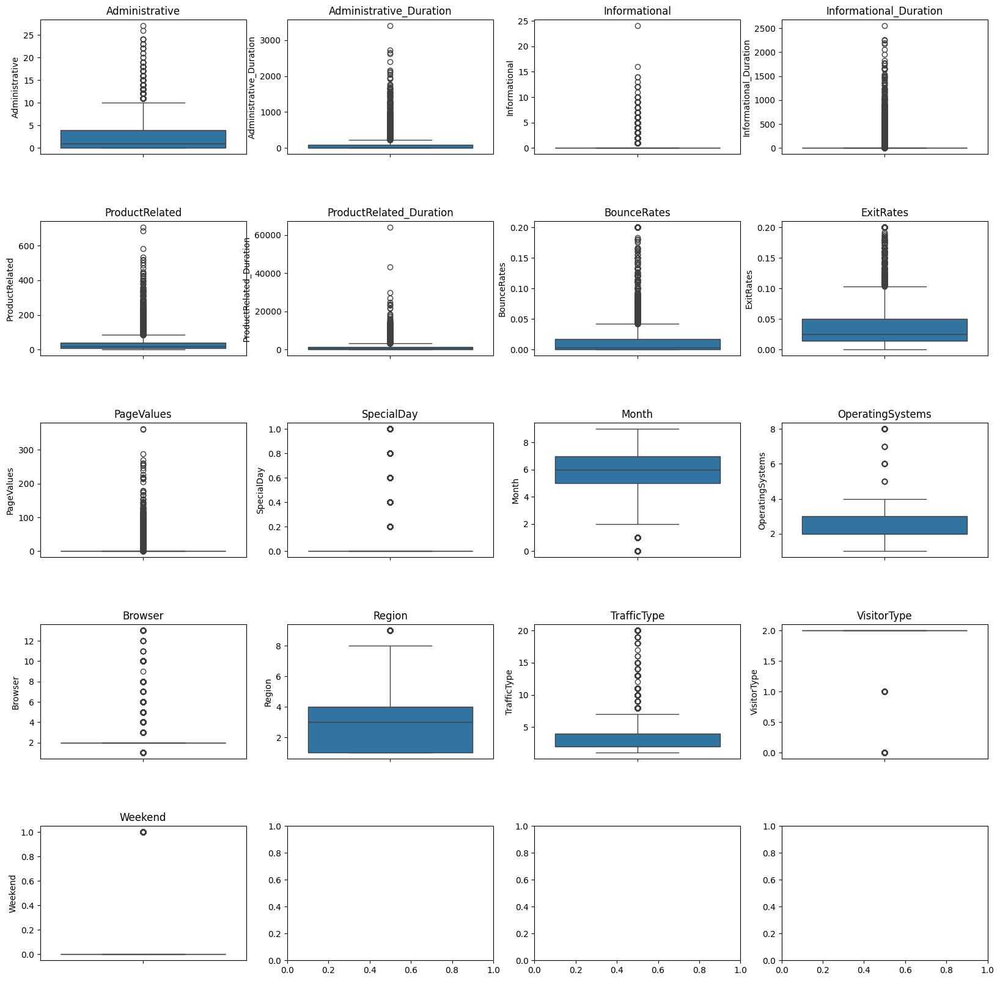

In [ ]:
# Visualizing outliers using boxplot
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))
fig.subplots_adjust(hspace=0.5)
for i, ax in enumerate(axes.flatten()):
    if i < len(dataset.columns) - 1:
        sns.boxplot(y=dataset.iloc[:, i], ax=ax)
        ax.set_title(dataset.columns[i])

plt.show()

persiapan untuk penanganan oulier

In [ ]:
# Separating the features and the target variable
X = dataset.iloc[:, :-1].values
y = dataset.iloc[:, -1].values

penghapusan oulier

In [ ]:
# Removing outliers using Z-score method
from scipy import stats
z_scores = np.abs(stats.zscore(X))
filtered_entries = (z_scores < 3).all(axis=1)
X = X[filtered_entries]
y = y[filtered_entries]

menampilkan data setelah penghapusan oulier

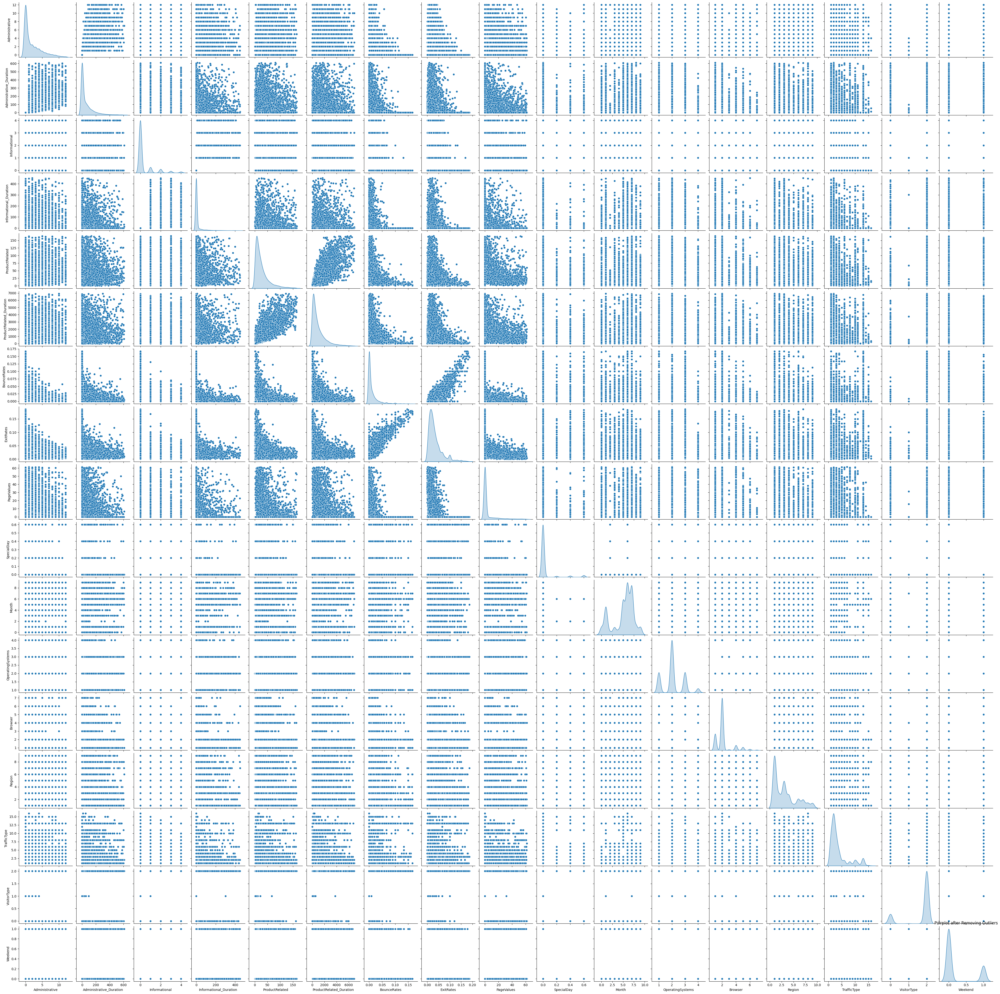

In [ ]:
# Visualizing the data after removing outliers
sns.pairplot(pd.DataFrame(X, columns=dataset.columns[:-1]), diag_kind='kde')
plt.title('Pairplot after Removing Outliers')
plt.show()

## SPLITING DATA

In [ ]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)


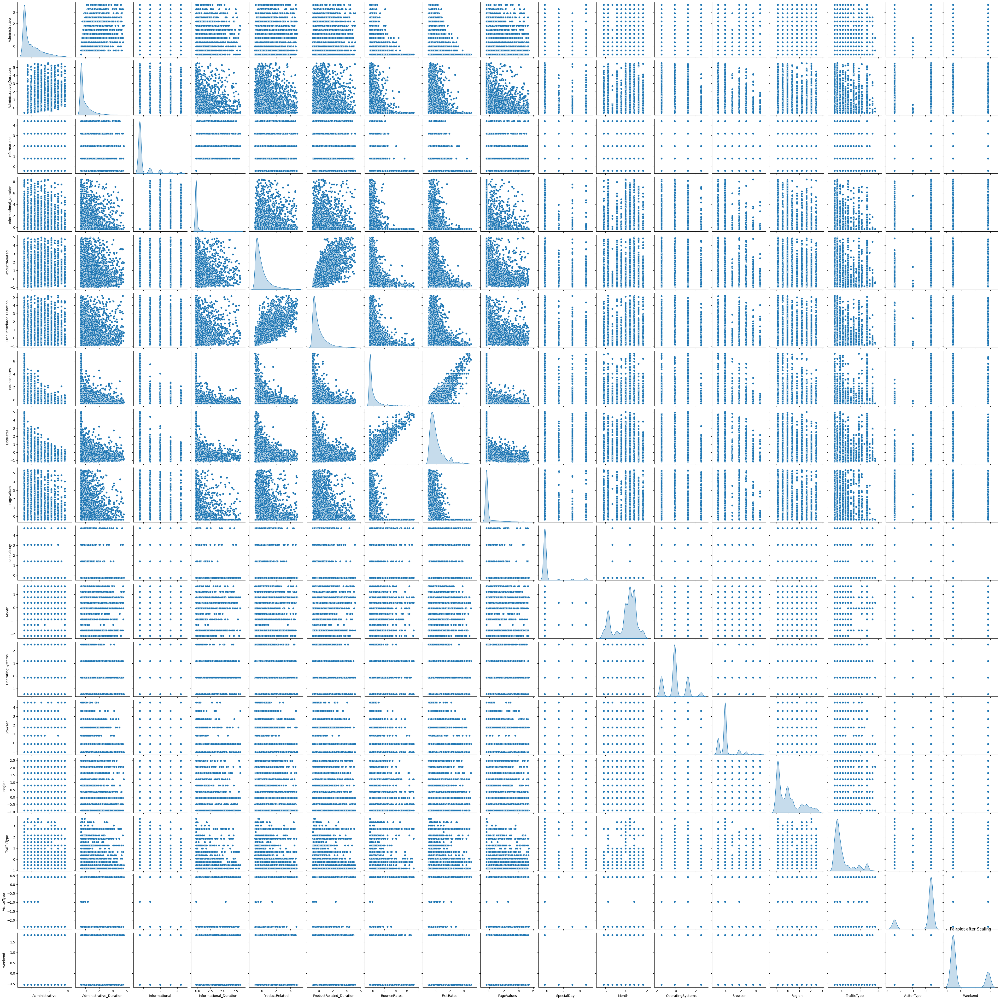

In [ ]:
# Visualizing the data after scaling
sns.pairplot(pd.DataFrame(X, columns=dataset.columns[:-1]), diag_kind='kde')
plt.title('Pairplot after Scaling')
plt.show()

In [ ]:
# Defining the KFold Cross-Validator with 5 folds
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Lists to hold performance metrics for each fold
fold_accuracies_svm = []
fold_precisions_svm = []
fold_recalls_svm = []

fold_accuracies_rf = []
fold_precisions_rf = []
fold_recalls_rf = []

## MODELING

In [ ]:
# K-Fold Cross-Validation
for fold_idx, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Training SVM
    svm_model = SVC(kernel='linear')
    svm_model.fit(X_train, y_train)
    y_pred_svm = svm_model.predict(X_test)

    # Calculating metrics for SVM
    accuracy_svm = accuracy_score(y_test, y_pred_svm)
    precision_svm = precision_score(y_test, y_pred_svm)
    recall_svm = recall_score(y_test, y_pred_svm)

    fold_accuracies_svm.append(accuracy_svm)
    fold_precisions_svm.append(precision_svm)
    fold_recalls_svm.append(recall_svm)

    # Training Random Forest
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)

    # Calculating metrics for Random Forest
    accuracy_rf = accuracy_score(y_test, y_pred_rf)
    precision_rf = precision_score(y_test, y_pred_rf)
    recall_rf = recall_score(y_test, y_pred_rf)

    fold_accuracies_rf.append(accuracy_rf)
    fold_precisions_rf.append(precision_rf)
    fold_recalls_rf.append(recall_rf)

    # Printing metrics for each fold
    print(f"Fold {fold_idx + 1}:")
    print(f"SVM Accuracy: {accuracy_svm:.2f}, Precision: {precision_svm:.2f}, Recall: {recall_svm:.2f}")
    print(f"RF Accuracy: {accuracy_rf:.2f}, Precision: {precision_rf:.2f}, Recall: {recall_rf:.2f}")
    print()

# Calculating mean and std deviation of metrics across folds
mean_accuracy_svm = np.mean(fold_accuracies_svm)
std_accuracy_svm = np.std(fold_accuracies_svm)
mean_precision_svm = np.mean(fold_precisions_svm)
std_precision_svm = np.std(fold_precisions_svm)
mean_recall_svm = np.mean(fold_recalls_svm)
std_recall_svm = np.std(fold_recalls_svm)

mean_accuracy_rf = np.mean(fold_accuracies_rf)
std_accuracy_rf = np.std(fold_accuracies_rf)
mean_precision_rf = np.mean(fold_precisions_rf)
std_precision_rf = np.std(fold_precisions_rf)
mean_recall_rf = np.mean(fold_recalls_rf)
std_recall_rf = np.std(fold_recalls_rf)

# Printing mean metrics across folds
print("Mean Metrics Across Folds:")
print(f'SVM Mean Accuracy: {mean_accuracy_svm:.2f} ± {std_accuracy_svm:.2f}')
print(f'SVM Mean Precision: {mean_precision_svm:.2f} ± {std_precision_svm:.2f}')
print(f'SVM Mean Recall: {mean_recall_svm:.2f} ± {std_recall_svm:.2f}')
print()
print(f'Random Forest Mean Accuracy: {mean_accuracy_rf:.2f} ± {std_accuracy_rf:.2f}')
print(f'Random Forest Mean Precision: {mean_precision_rf:.2f} ± {std_precision_rf:.2f}')
print(f'Random Forest Mean Recall: {mean_recall_rf:.2f} ± {std_recall_rf:.2f}')


Fold 1:
SVM Accuracy: 0.88, Precision: 0.63, Recall: 0.40
RF Accuracy: 0.90, Precision: 0.72, Recall: 0.51

Fold 2:
SVM Accuracy: 0.89, Precision: 0.77, Recall: 0.42
RF Accuracy: 0.89, Precision: 0.74, Recall: 0.50

Fold 3:
SVM Accuracy: 0.90, Precision: 0.70, Recall: 0.45
RF Accuracy: 0.90, Precision: 0.69, Recall: 0.54

Fold 4:
SVM Accuracy: 0.89, Precision: 0.71, Recall: 0.45
RF Accuracy: 0.89, Precision: 0.68, Recall: 0.46

Fold 5:
SVM Accuracy: 0.91, Precision: 0.73, Recall: 0.48
RF Accuracy: 0.91, Precision: 0.73, Recall: 0.57

Mean Metrics Across Folds:
SVM Mean Accuracy: 0.89 ± 0.01
SVM Mean Precision: 0.71 ± 0.04
SVM Mean Recall: 0.44 ± 0.03

Random Forest Mean Accuracy: 0.90 ± 0.01
Random Forest Mean Precision: 0.71 ± 0.02
Random Forest Mean Recall: 0.51 ± 0.03


In [ ]:
# Function to evaluate the model using K-Fold Cross-Validation
def evaluate_model(model, X, y):
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    accuracies = []
    conf_matrices = []
    reports = []
    for train_index, test_index in skf.split(X, y):
        X_train_fold, X_test_fold = X[train_index], X[test_index]
        y_train_fold, y_test_fold = y[train_index], y[test_index]
        print(f"Training data in fold: {len(train_index)}, Testing data in fold: {len(test_index)}")
        model.fit(X_train_fold, y_train_fold)
        y_pred_fold = model.predict(X_test_fold)
        accuracies.append(accuracy_score(y_test_fold, y_pred_fold))
        conf_matrices.append(confusion_matrix(y_test_fold, y_pred_fold))
        reports.append(classification_report(y_test_fold, y_pred_fold, output_dict=True))
    return np.array(accuracies), conf_matrices, reports

In [ ]:
# Fitting SVM to the dataset
from sklearn.svm import SVC
classifier_svm = SVC(kernel='linear', random_state=0)

In [ ]:
# Fitting Random Forest Classification to the dataset
from sklearn.ensemble import RandomForestClassifier
classifier_rf = RandomForestClassifier(n_estimators=100, criterion='entropy', random_state=0)


## EVALUASI 2 MODEL SVM DAN RANDOM FOREST


In [ ]:
# Evaluating SVM with K-Fold Cross-Validation
accuracies_svm, conf_matrices_svm, reports_svm = evaluate_model(classifier_svm, X, y)
print("SVM Cross-Validation Accuracies:", accuracies_svm)
print("SVM Mean Accuracy:", accuracies_svm.mean())
print("SVM Standard Deviation:", accuracies_svm.std())

Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
SVM Cross-Validation Accuracies: [0.89556136 0.88355091 0.89503916 0.89765013 0.89503916]
SVM Mean Accuracy: 0.8933681462140992
SVM Standard Deviation: 0.005002163974862892


In [ ]:
# Evaluating Random Forest with K-Fold Cross-Validation
accuracies_rf, conf_matrices_rf, reports_rf = evaluate_model(classifier_rf, X, y)
print("Random Forest Cross-Validation Accuracies:", accuracies_rf)
print("Random Forest Mean Accuracy:", accuracies_rf.mean())
print("Random Forest Standard Deviation:", accuracies_rf.std())

Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Training data in fold: 7660, Testing data in fold: 1915
Random Forest Cross-Validation Accuracies: [0.91227154 0.90182768 0.8997389  0.90548303 0.90287206]
Random Forest Mean Accuracy: 0.9044386422976501
Random Forest Standard Deviation: 0.004331371562052798


In [ ]:
# Printing the results
print("SVM Confusion Matrices:")
for i, cm in enumerate(conf_matrices_svm, 1):
    print(f"Fold {i}:\n", cm)

print("SVM Classification Reports:")
for i, report in enumerate(reports_svm, 1):
    print(f"Fold {i}:\n", report)

print("Random Forest Confusion Matrices:")
for i, cm in enumerate(conf_matrices_rf, 1):
    print(f"Fold {i}:\n", cm)

print("Random Forest Classification Reports:")
for i, report in enumerate(reports_rf, 1):
    print(f"Fold {i}:\n", report)

SVM Confusion Matrices:
Fold 1:
 [[1599   42]
 [ 158  116]]
Fold 2:
 [[1573   68]
 [ 155  119]]
Fold 3:
 [[1597   44]
 [ 157  117]]
Fold 4:
 [[1598   43]
 [ 153  121]]
Fold 5:
 [[1588   52]
 [ 149  126]]
SVM Classification Reports:
Fold 1:
 {'0': {'precision': 0.9100739897552647, 'recall': 0.9744058500914077, 'f1-score': 0.9411418481459682, 'support': 1641}, '1': {'precision': 0.7341772151898734, 'recall': 0.4233576642335766, 'f1-score': 0.537037037037037, 'support': 274}, 'accuracy': 0.8955613577023499, 'macro avg': {'precision': 0.822125602472569, 'recall': 0.6988817571624921, 'f1-score': 0.7390894425915027, 'support': 1915}, 'weighted avg': {'precision': 0.8849065139166655, 'recall': 0.8955613577023499, 'f1-score': 0.8833221519350819, 'support': 1915}}
Fold 2:
 {'0': {'precision': 0.9103009259259259, 'recall': 0.9585618525289458, 'f1-score': 0.9338082517067379, 'support': 1641}, '1': {'precision': 0.6363636363636364, 'recall': 0.4343065693430657, 'f1-score': 0.5162689804772235, 'sup

In [ ]:
# Visualizing the importance of features for Random Forest
importances = classifier_rf.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, dataset.columns[indices[f]], importances[indices[f]]))


Feature ranking:
1. feature PageValues (0.342351)
2. feature ProductRelated_Duration (0.098250)
3. feature ExitRates (0.096155)
4. feature ProductRelated (0.082981)
5. feature Month (0.062016)
6. feature Administrative_Duration (0.060970)
7. feature BounceRates (0.051849)
8. feature Administrative (0.040877)
9. feature TrafficType (0.033218)
10. feature Region (0.032477)
11. feature Informational_Duration (0.023388)
12. feature OperatingSystems (0.017760)
13. feature Browser (0.017554)
14. feature Informational (0.014992)
15. feature VisitorType (0.011673)
16. feature Weekend (0.010564)
17. feature SpecialDay (0.002927)


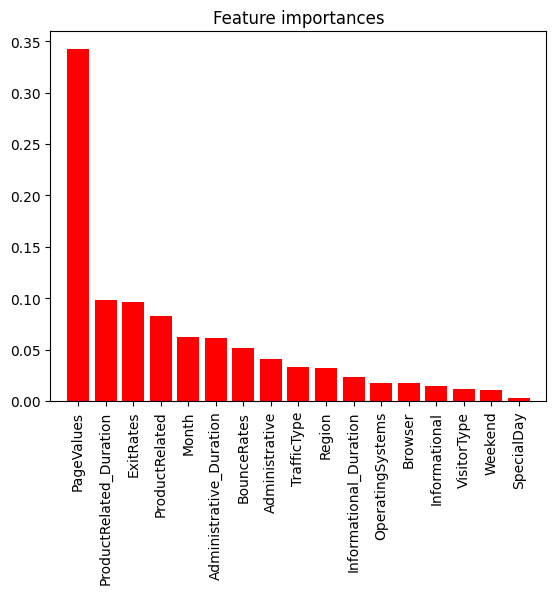

In [ ]:
# Plotting the feature importances
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], color="r", align="center")
plt.xticks(range(X.shape[1]), dataset.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()


## EVALUSI MENGGUNAKAN HEATMAP


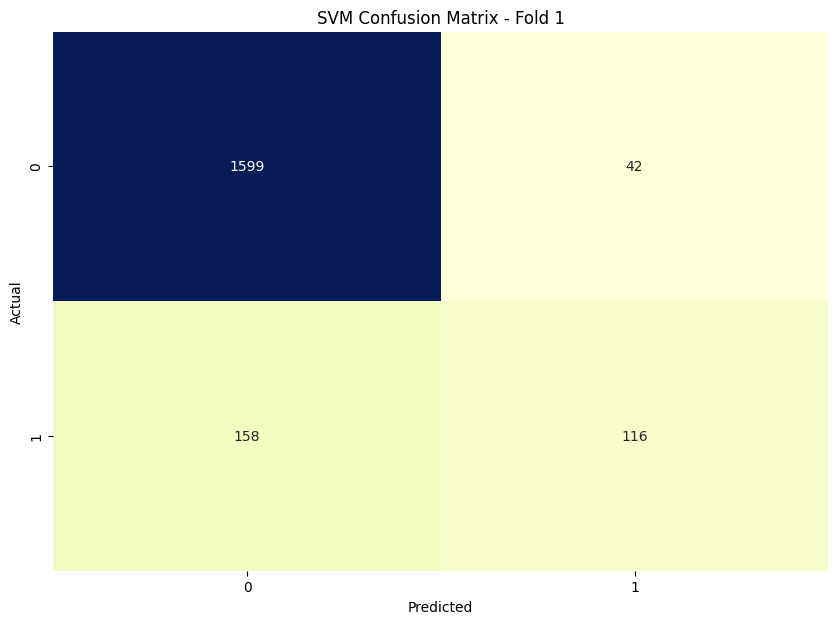

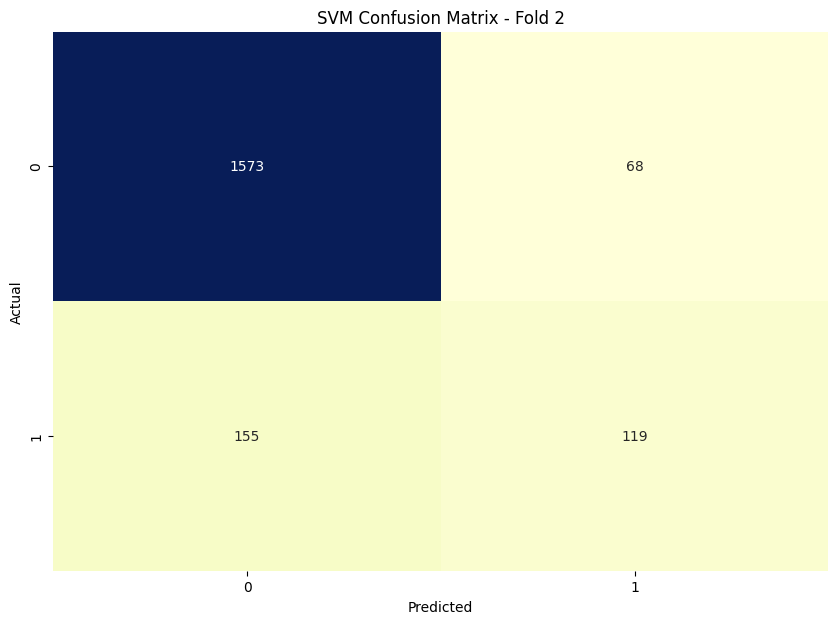

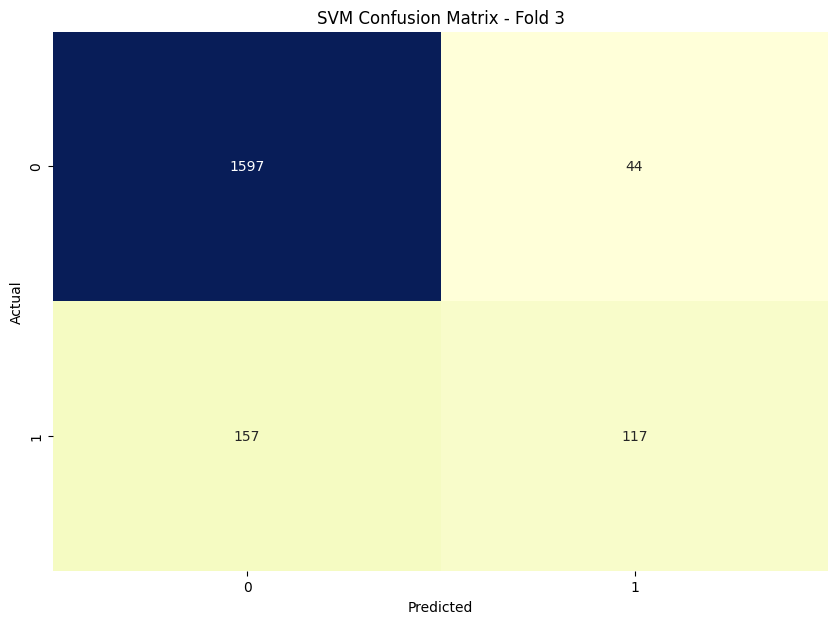

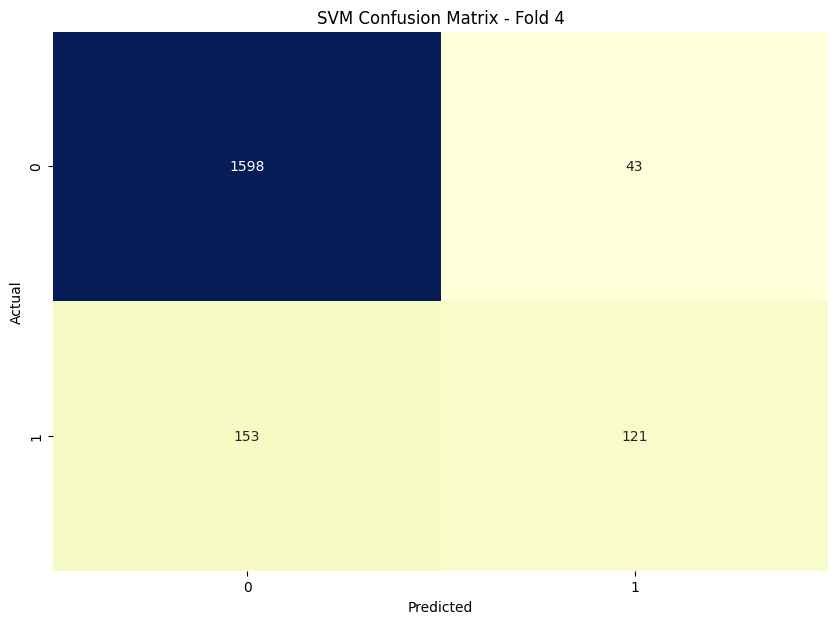

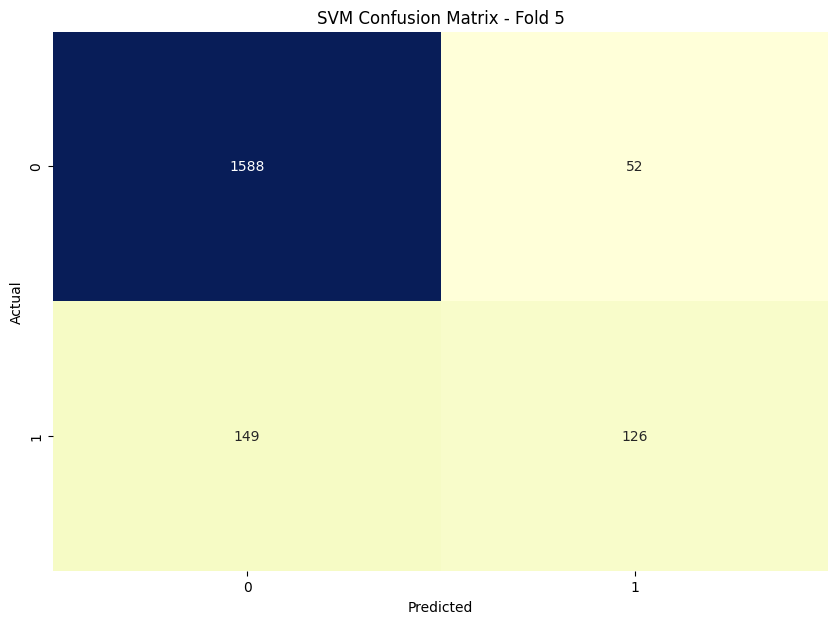

In [ ]:
# Plotting heatmap for SVM confusion matrices
for i, cm in enumerate(conf_matrices_svm, 1):
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
    plt.title(f'SVM Confusion Matrix - Fold {i}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


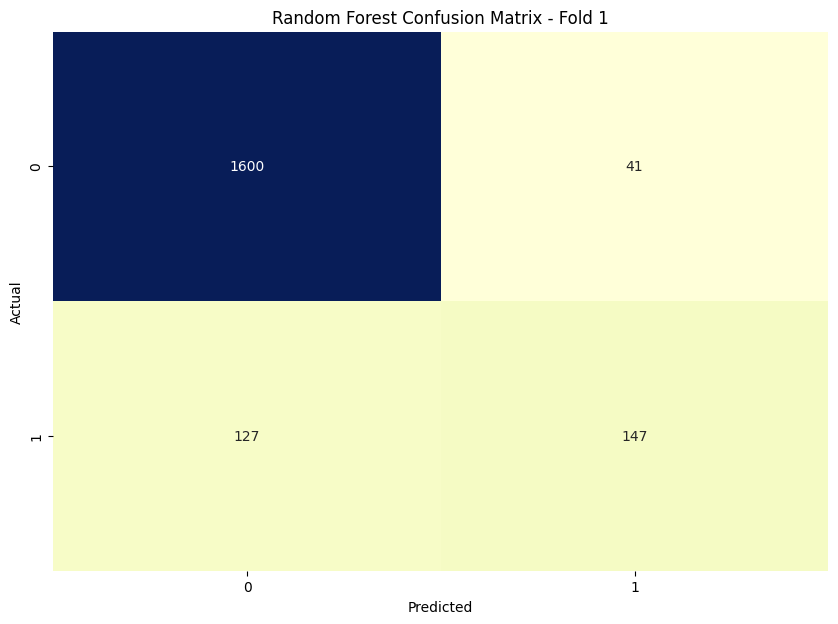

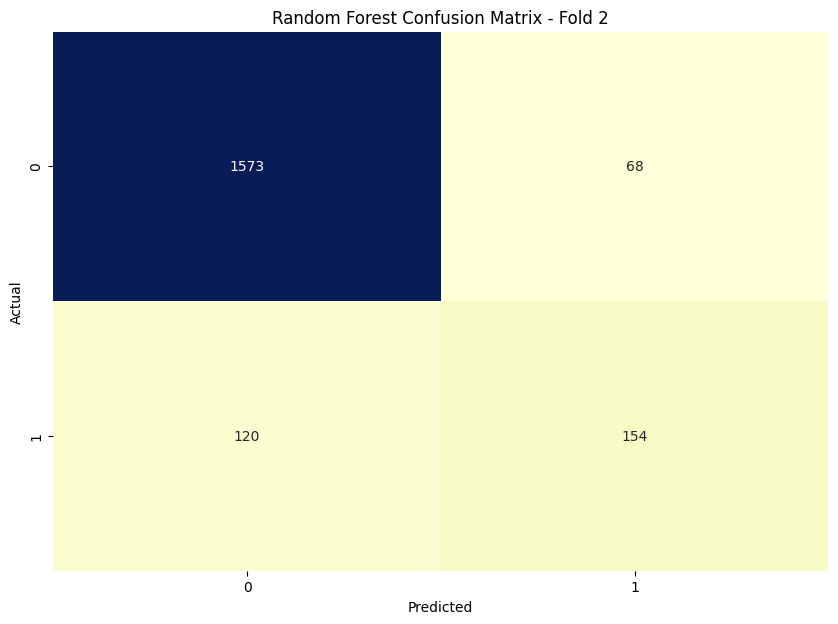

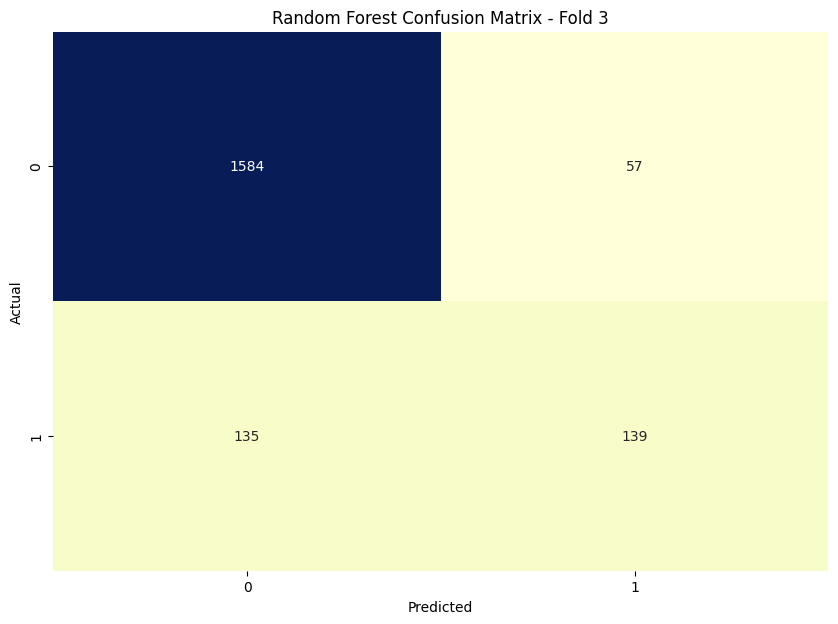

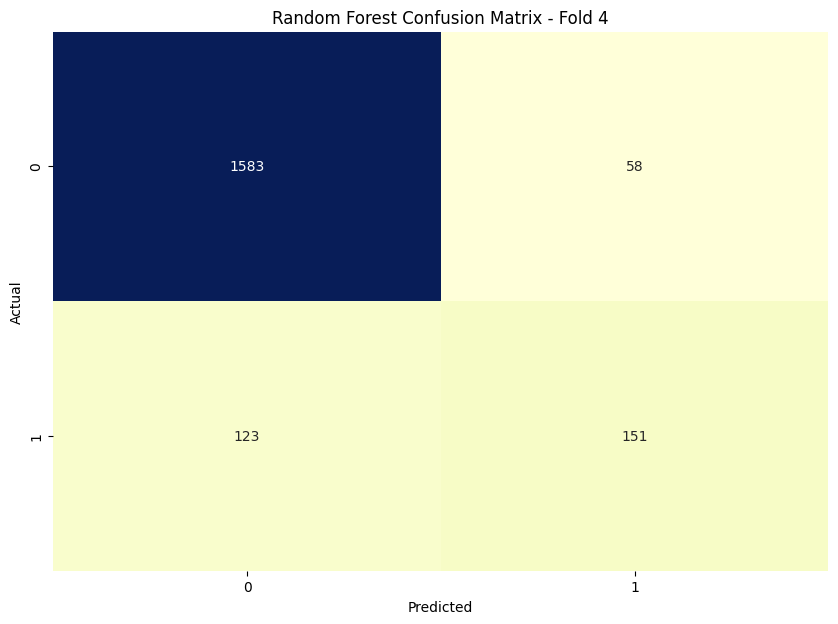

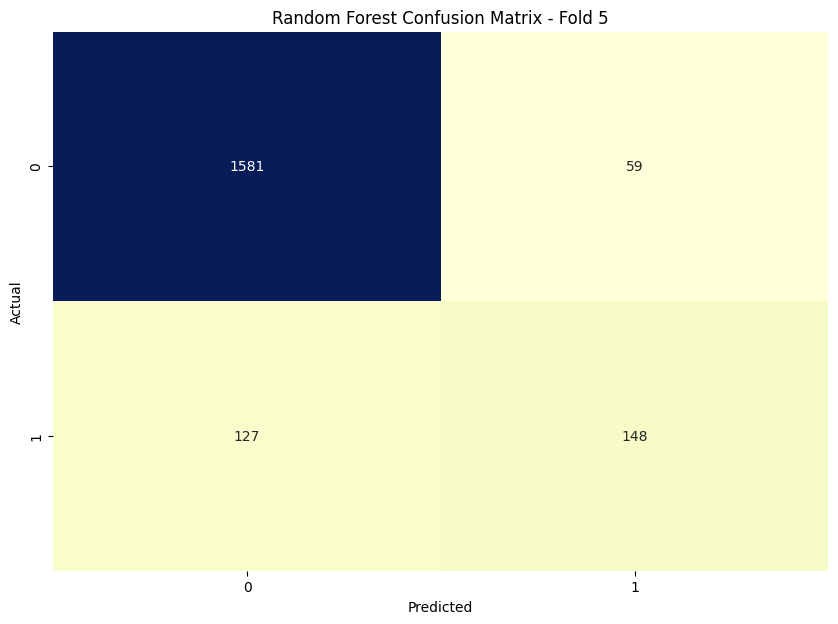

In [ ]:
# Plotting heatmap for Random Forest confusion matrices
for i, cm in enumerate(conf_matrices_rf, 1):
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
    plt.title(f'Random Forest Confusion Matrix - Fold {i}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


## EVALUASI MENGGUNAKAN BAR CHARTS

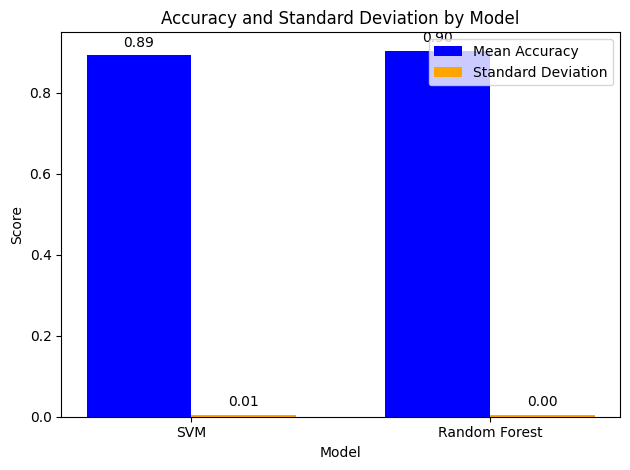

In [ ]:
# Plotting accuracy comparison
models = ['SVM', 'Random Forest']
accuracies = [accuracies_svm.mean(), accuracies_rf.mean()]
std_devs = [accuracies_svm.std(), accuracies_rf.std()]

x = np.arange(len(models))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, accuracies, width, label='Mean Accuracy', color='b')
rects2 = ax.bar(x + width/2, std_devs, width, label='Standard Deviation', color='orange')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Model')
ax.set_ylabel('Score')
ax.set_title('Accuracy and Standard Deviation by Model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Add labels on the bars with smaller font size and different padding
ax.bar_label(rects1, padding=4, fontsize=10, fmt='%.2f')
ax.bar_label(rects2, padding=4, fontsize=10, fmt='%.2f')

fig.tight_layout()

plt.show()
